# Vehicle Detection

In [1]:
import cv2
import glob
import time
import pickle
import numpy as np
import  pandas as pd
import collections

import os
import os.path as path

from skimage.feature import hog
from skimage import color, exposure

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from moviepy.editor import VideoFileClip

from scipy.ndimage.measurements import label

from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split

from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 

In [2]:
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 

# Data Exploration

In [3]:
# images are divided up into vehicles and non-vehicles
images = glob.glob('vehicles/*/*.png')
cars = []

for image in images:
    cars.append(image)
len(cars)

8792

In [4]:
# images are divided up into vehicles and non-vehicles
images = glob.glob('non-vehicles/*/*.png')
notcars = []

for image in images:
    notcars.append(image)
len(notcars)

8968

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


Text(0.5, 1.0, 'Example Not-car Image')

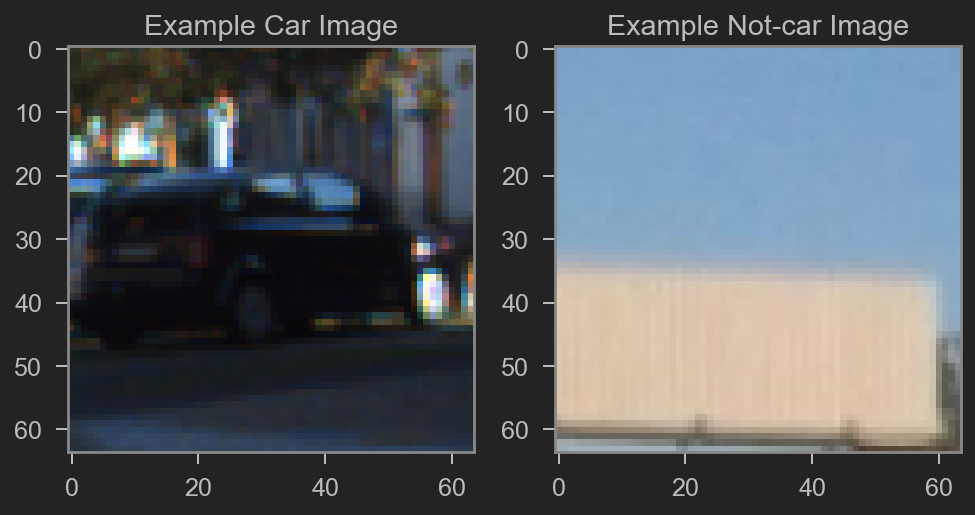

In [5]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    
    # Return data_dict
    return data_dict
    
data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])

# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')

In [6]:
def load_image(path, to_rgb=True):
    """Load image from the given path. By default the returned image is in RGB.
    When to_rgb is set to False the image return is in BGR."""
    img = cv2.imread(path)
    
    return img if not to_rgb else cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [7]:
example_vehicle_imgs= np.asarray(list(map(lambda path: load_image(path),
                                          np.asarray(cars)[np.random.randint(0, high=len(cars), size=5)]))) 

example_non_vehicle_imgs= np.asarray(list(map(lambda path: load_image(path),
                                              np.asarray(notcars)[np.random.randint(0, high=len(notcars), size=5)])))

In [8]:
def show_image_list(img_list, img_labels, title, cols=2, fig_size=(15, 15), show_ticks=True):
    """Utility function to to show a list of images"""
    rows = len(img_list)
    cmap = None

    fig, axes = plt.subplots(rows, cols, figsize=fig_size)

    for i in range(0, rows):
        for j in range(0, cols):
            ax = axes[i, j] if rows > 1 else axes[j]
            #k = i * cols + j
            img_name = img_labels[i][j]
            img = img_list[i][j]
            if len(img.shape) < 3 or img.shape[-1] < 3:
                cmap = "gray"
                img = np.reshape(img, (img.shape[0], img.shape[1]))

            if not show_ticks:
                ax.axis("off")

            ax.imshow(img, cmap=cmap)
            ax.set_title(img_name)

    fig.suptitle(title, fontsize=12, fontweight='bold', y=1)
    fig.tight_layout()
    plt.show()

    return

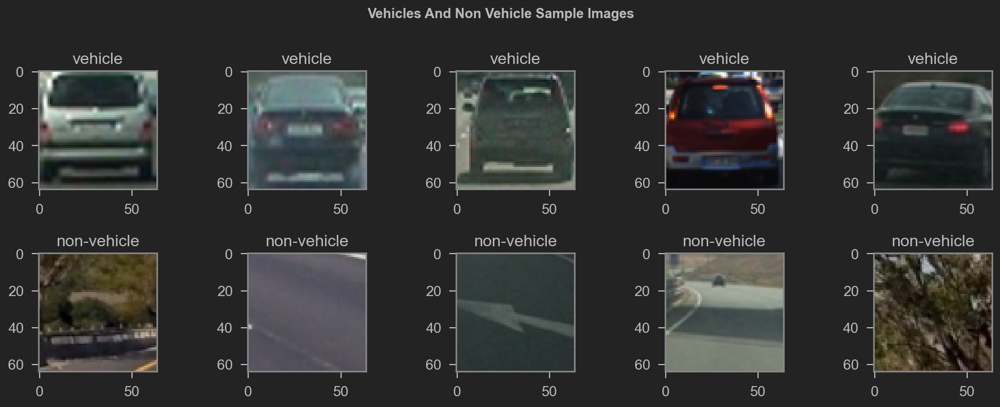

In [9]:
show_image_list([example_vehicle_imgs, example_non_vehicle_imgs],
                [np.repeat("vehicle", 5), np.repeat("non-vehicle", 5)], 
                "Vehicles And Non Vehicle Sample Images",
                cols=5, fig_size=(13, 5))

# Histogram of Oriented Gradients (HOG) Feature Extraction

The essential thought behind the histogram of oriented gradients descriptor is that local object appearance and shape within an image can be described by the distribution of intensity gradients or edge directions. The image is divided into small connected regions called cells, and for the pixels within each cell, a histogram of gradient directions is compiled. The descriptor is the concatenation of these histograms. For improved accuracy, the local histograms can be contrast-normalized by calculating a measure of the intensity across a larger region of the image, called a block, and then using this value to normalize all cells within the block. This normalization results in better invariance to changes in illumination and shadowing.

The HOG descriptor has a few key advantages over other descriptors. Since it operates on local cells, it is invariant to geometric and photometric transformations, except for object orientation. Such changes would only appear in larger spatial regions. Moreover, as Dalal and Triggs discovered, coarse spatial sampling, fine orientation sampling, and strong local photometric normalization permits the individual body movement of pedestrians to be ignored so long as they maintain a roughly upright position. The HOG descriptor is thus particularly suited for human detection in images.

In [10]:
def get_hog_features(img, orient=9, pix_per_cell=8, cell_per_block=2, vis=False, feature_vec=True, b_norm="L2-Hys"):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  block_norm= 'L2-Hys',
                                  visualize=vis, feature_vector=feature_vec, transform_sqrt=True)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       block_norm= 'L2-Hys',
                       visualize=vis, feature_vector=feature_vec,transform_sqrt=True)
        return features

Text(0.5, 1.0, 'HOG Visualization')

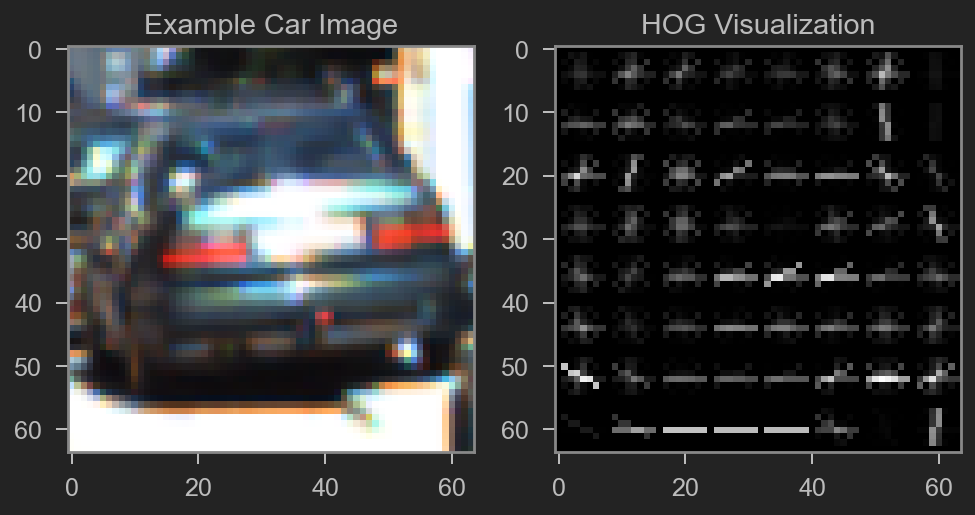

In [11]:
# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))

# Read in the image
image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2

# Call our function with vis=True to see an image output
features, hog_image = get_hog_features(gray,
                                       orient, 
                                       pix_per_cell,
                                       cell_per_block, 
                                       vis=True,
                                       feature_vec=False)

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')

# Combine and Normalize Features

In [12]:
# Define a function to compute binned color features  
# def bin_spatial(img, size=(32, 32)):
    
#     # Use cv2.resize().ravel() to create the feature vector
#     features = cv2.resize(img, size).ravel() 
    
#     # Return the feature vector
#     return features

def bin_spatial(img, size=(32, 32)):
    
    # Use cv2.resize().ravel() to create the feature vector
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    
    return np.hstack((color1, color2, color3))

# def subsample_image(img, new_size=(32,32), single_vector=True):
#     """
#     Resizes the image to the new size and returns either a 1-D vector or multi-dimensional matrix depending
#     on the value of single_vector
#     """
#     features = cv2.resize(img, new_size)
#     return features.ravel() if single_vector else features

In [13]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [14]:
def change_color_space(img, cspace="YCrCb"):
    """
    Takes in a RGB image and returns a new image in the target color space.
    If the current image and target image are both rgb, then a copy of the image is returned
    """
    feature_image = None
    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif cspace == "YCrCb":
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        elif cspace == "LAB":
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    else:
        feature_image = np.copy(img)

    return feature_image

In [15]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                     hist_bins=32, hist_range=(0, 256)):
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs:
        
        # Read in each one by one
        image = mpimg.imread(file)
        image = cv2.resize(image, (64,64))
        # apply color conversion if other than 'RGB'
        feature_image = change_color_space(image, cspace='RGB')
            
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)
        
        # Append the new feature vector to the features list
        features.append(np.concatenate((spatial_features, hist_features)))
        
    # Return list of feature vectors
    return features

In [16]:
car_features = extract_features(cars,
                                cspace='RGB',
                                spatial_size=(32, 32),
                                hist_bins=32,
                                hist_range=(0, 256))

notcar_features = extract_features(notcars,
                                   cspace='RGB',
                                   spatial_size=(32, 32),
                                   hist_bins=32,
                                   hist_range=(0, 256))

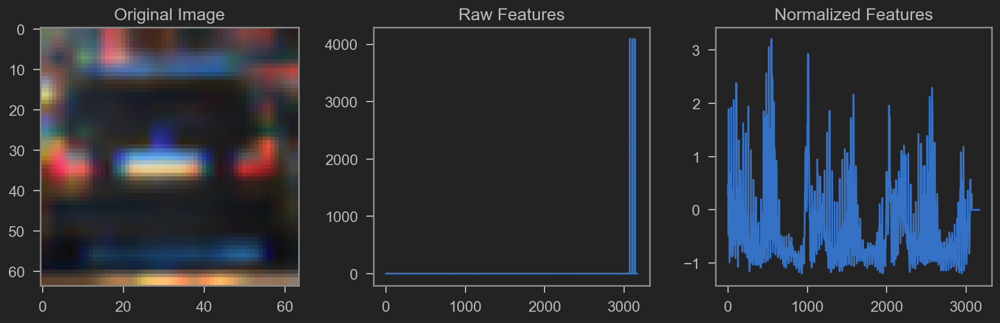

In [17]:
if len(car_features) > 0:
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)   
    
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    car_ind = np.random.randint(0, len(cars))
    
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars[car_ind]))
    plt.title('Original Image')
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    fig.tight_layout()
else: 
    print('Your function only returns empty feature vectors...')

#### Exploring features


In [18]:
class FeatureConfig:
    """
    Stores feature configuration
    """
    def __init__(self, color_space,
                 hog_orientations,
                 hog_pixels_per_cell,
                 hog_cells_per_block,
                 hog_block_norm,
                 hog_color_channels=[0,1,2]):
        
        self.color_space = color_space
        self.hog_orientations = hog_orientations
        self.hog_pixels_per_cell = hog_pixels_per_cell
        self.hog_cells_per_block = hog_cells_per_block
        self.hog_block_norm = hog_block_norm
        self.hog_color_channels = hog_color_channels

test_configs = [FeatureConfig("RGB", 9, 8, 2, "L2-Hys"),
                FeatureConfig("RGB", 9, 10, 2, "L2-Hys"),
                FeatureConfig("RGB", 9, 12, 2, "L2-Hys"),
                FeatureConfig("RGB", 9, 14, 2, "L2-Hys"),
                FeatureConfig("RGB", 9, 16, 2, "L2-Hys"),
                FeatureConfig("RGB", 11, 8, 2, "L2-Hys"),    
                FeatureConfig("RGB", 11, 10, 2, "L2-Hys"),
                FeatureConfig("RGB", 11, 12, 2, "L2-Hys"),
                FeatureConfig("RGB", 11, 14, 2, "L2-Hys"),
                FeatureConfig("RGB", 11, 16, 2, "L2-Hys")]

In [19]:
def get_features_from_config(img, config):
    """
    Returns the tuple of the image in the configured color space, and a list of hog visualisations for each color channel
    """
    hog_visualisations = []
    cspace_img = change_color_space(img, config.color_space)
    
    for ch in [0, 1, 2]:
        _, hog_vis = get_hog_features(cspace_img[:,:,ch],
                                      config.hog_orientations,
                                      config.hog_pixels_per_cell, 
                                      config.hog_cells_per_block,
                                      vis=True,
                                      feature_vec=True)
        
        hog_visualisations.append(hog_vis)
    
    return (cspace_img, hog_visualisations)

In [20]:
def get_hog_features_from_multiple_configs(img, configs):
    """
    Returns the tuple (features, labels) resulting from the extraction of hog features for the passed configs
    """
    features = []
    labels = []
    for config in configs:
        cspace_img, hog_imgs = get_features_from_config(img, config)    
        features.append([cspace_img, hog_imgs[0], hog_imgs[1], hog_imgs[2]])
        hog_config_str = "o={0}, px/c={1}, c/bk={2}".format(config.hog_orientations, 
                                                          config.hog_pixels_per_cell, 
                                                          config.hog_cells_per_block)
        labels.append([config.color_space, 
                        "[1]: {0}".format(hog_config_str),
                        "[2]: {0}".format(hog_config_str),
                        "[3]: {0}".format(hog_config_str)])
    
    return (features, labels)

In [21]:
sample_vehicle_img = example_vehicle_imgs[np.random.randint(0, len(example_vehicle_imgs))]
sample_non_vehicle_img = example_non_vehicle_imgs[np.random.randint(0, len(example_non_vehicle_imgs))]

In [22]:
vehicle_imgs_hog, vehicle_imgs_hog_labels = get_hog_features_from_multiple_configs(sample_vehicle_img, test_configs)

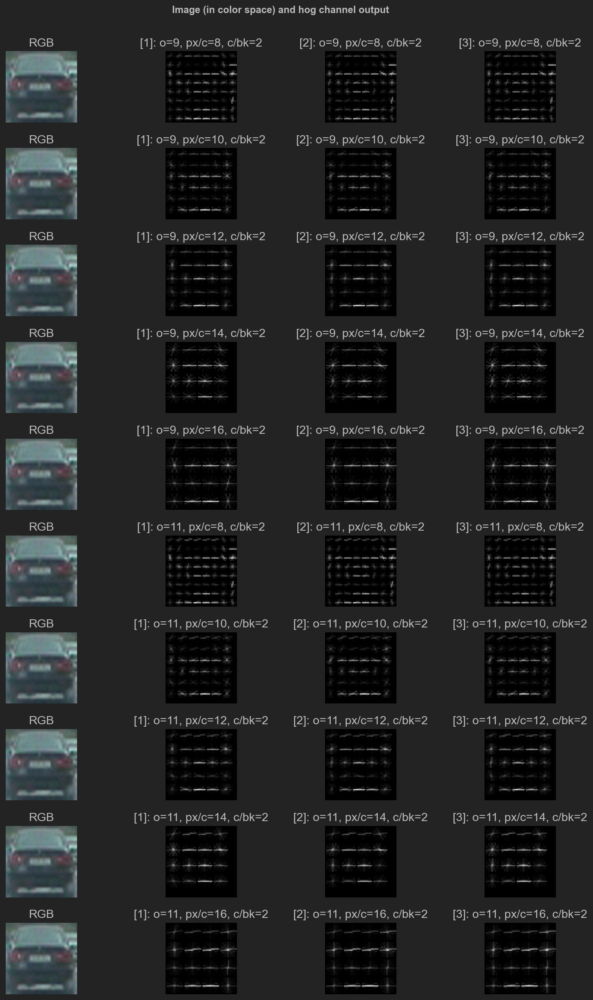

In [23]:
show_image_list(vehicle_imgs_hog, vehicle_imgs_hog_labels, 
                "Image (in color space) and hog channel output", cols=4, fig_size=(12, 17), show_ticks=False)

From pure observation, it looks like a HOG configuration with:

11 orientations

14 pixels per cell

2 cells per blocks produce the most distinctive gradients of a vehicle.

In [24]:
test_configs = [FeatureConfig("RGB", 11, 14, 2, "L2-Hys"),
                FeatureConfig("RGB", 11, 14, 3, "L2-Hys"),
                FeatureConfig("RGB", 11, 14, 4, "L2-Hys")]

In [25]:
vehicle_imgs_hog, vehicle_imgs_hog_labels = get_hog_features_from_multiple_configs(sample_vehicle_img, test_configs)

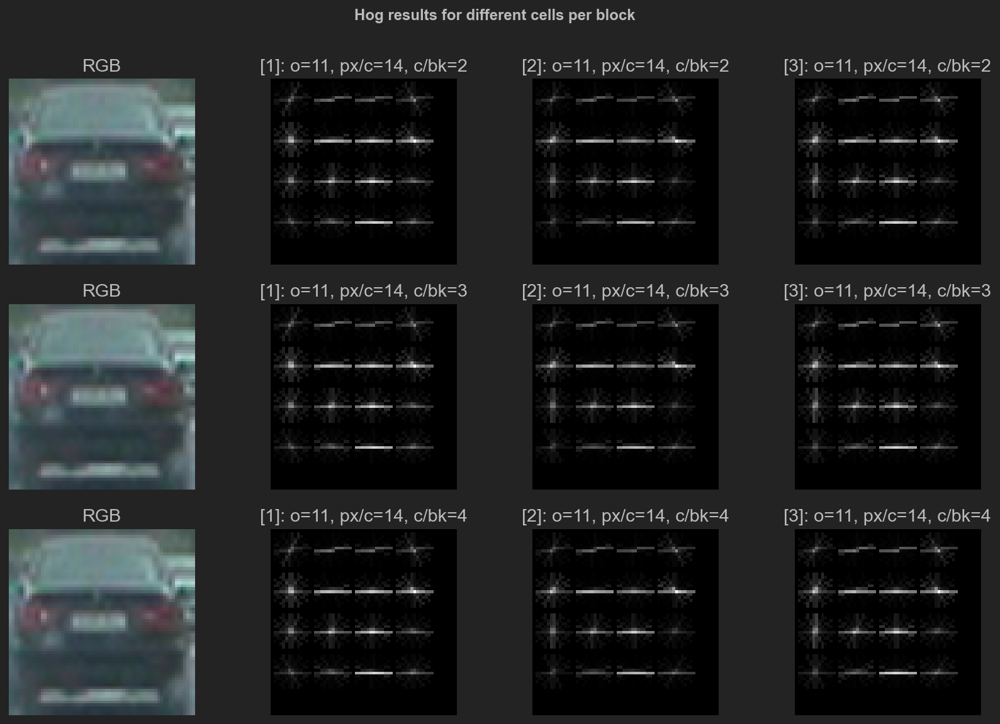

In [26]:
show_image_list(vehicle_imgs_hog, vehicle_imgs_hog_labels, 
                "Hog results for different cells per block", cols=4, fig_size=(12, 8), show_ticks=False)

#### Finding suitable colour

In [27]:
test_configs = [FeatureConfig("RGB", 11, 14, 2, "L2-Hys"),
                FeatureConfig("HSV", 11, 14, 2, "L2-Hys"),
                FeatureConfig("HLS", 11, 14, 2, "L2-Hys"),
                FeatureConfig("YUV", 11, 14, 2, "L2-Hys"),
                FeatureConfig("YCrCb", 11, 14, 2, "L2-Hys"),
                FeatureConfig("LAB", 11, 14, 2, "L2-Hys")]

In [28]:
vehicle_imgs_hog, vehicle_imgs_hog_labels = get_hog_features_from_multiple_configs(sample_vehicle_img, test_configs)

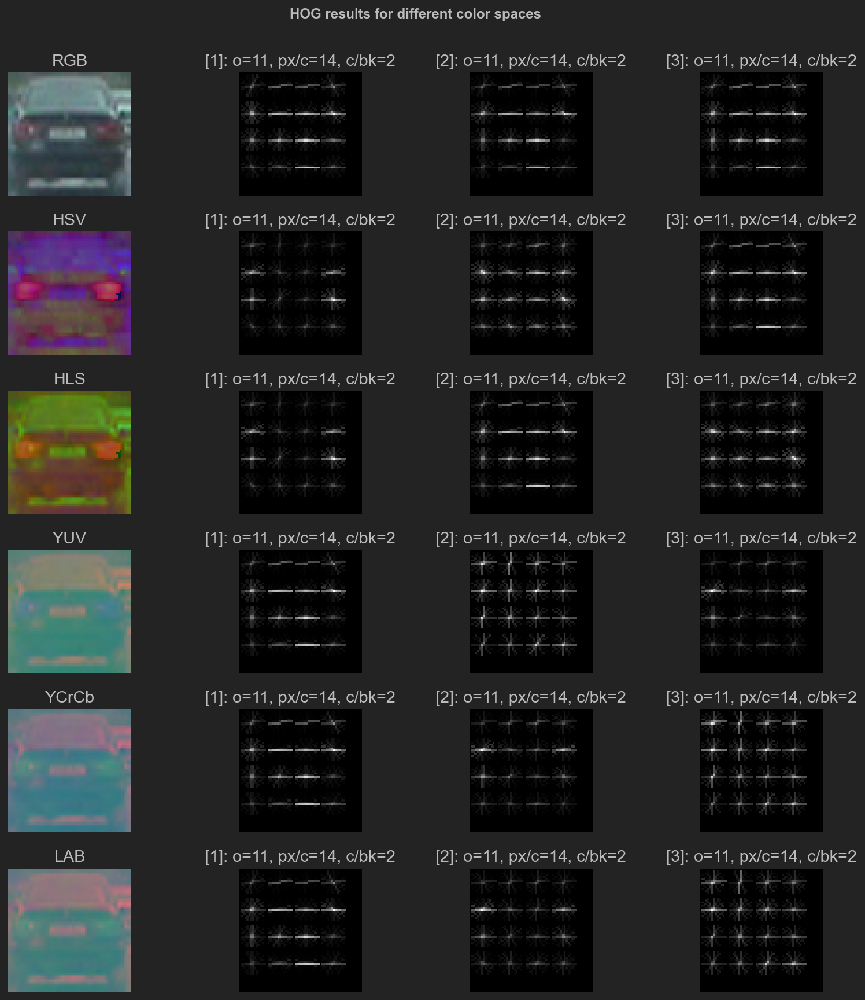

In [29]:
show_image_list(vehicle_imgs_hog, vehicle_imgs_hog_labels, 
                "HOG results for different color spaces", cols=4, fig_size=(12, 12), show_ticks=False)

In [30]:
sample_vehicle_img = example_vehicle_imgs[np.random.randint(0, len(example_vehicle_imgs))]

In [31]:
hog_features, hog_labels = get_hog_features_from_multiple_configs(sample_vehicle_img, test_configs)

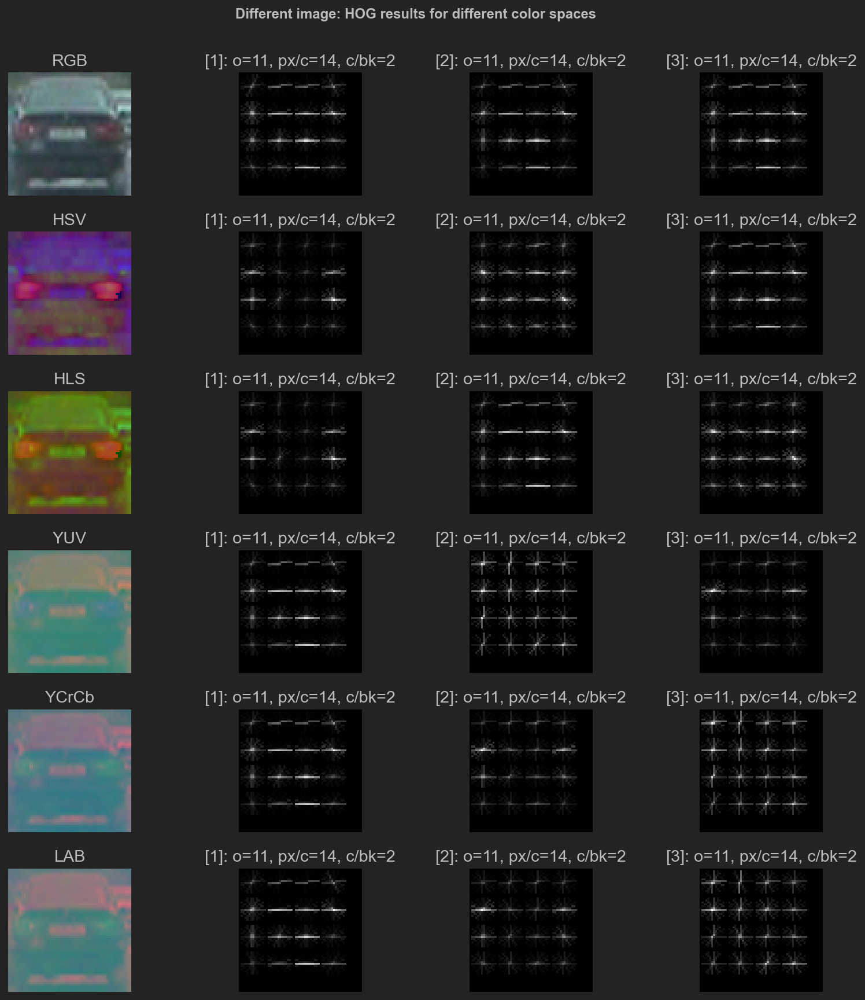

In [32]:
show_image_list(hog_features, hog_labels, 
                "Different image: HOG results for different color spaces", cols=4, fig_size=(12, 12), show_ticks=False)

On a dark image such as the one above, we can observe that HOG on the channel that carries the most light information produces bad results. We must therefore take into account all color channel to capture the most features. In the end, our configuration looks as follows:

ALL channels of YCrCb color space

HOG orientations of 11

HOG pixels per cell of 14

HOG cells per cell of 2

# Color Classification

In [33]:
spatial = 32
histbin = 32

car_features = extract_features(cars,
                                cspace='RGB',
                                spatial_size=(spatial, spatial),
                                hist_bins=histbin,
                                hist_range=(0, 256))

notcar_features = extract_features(notcars,
                                   cspace='RGB',
                                   spatial_size=(spatial, spatial),
                                   hist_bins=histbin,
                                   hist_range=(0, 256))

In [34]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64) 

# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)

# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

In [35]:
print('Using spatial binning of:',spatial,
      'and', histbin,'histogram bins')
print('Feature vector length:', len(X_train[0]))

# Use a linear SVC 
svc = LinearSVC()

# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Using spatial binning of: 32 and 32 histogram bins
Feature vector length: 3168
49.42 Seconds to train SVC...
Test Accuracy of SVC =  0.9062
My SVC predicts:  [1. 0. 0. 0. 0. 0. 1. 0. 1. 0.]
For these 10 labels:  [1. 0. 0. 0. 0. 0. 1. 0. 1. 1.]
0.01601 Seconds to predict 10 labels with SVC


# Classification using HOG features

In [36]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0):
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs:
        
        # Read in each one by one
        image = mpimg.imread(file)
        image = cv2.resize(image, (64,64))
        # apply color conversion if other than 'RGB'
        feature_image = change_color_space(image, cspace=cspace)    

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                                     orient,
                                                     pix_per_cell, cell_per_block,
                                                     vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel],
                                            orient,
                                            pix_per_cell, cell_per_block,
                                            vis=False, feature_vec=True)
            
        # Append the new feature vector to the features list
        features.append(hog_features)
        
    # Return list of feature vectors
    return features

In [37]:
# Reduce the sample size because HOG features are slow to compute
# The quiz evaluator times out after 13s of CPU time
sample_size = 1000
cars = cars[0:sample_size]
notcars = notcars[0:sample_size]

### Tweak these parameters and see how the results change.
colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 1 # Can be 0, 1, 2, or "ALL"

In [38]:
t=time.time()
car_features = extract_features(cars, cspace=colorspace, 
                                orient=orient, 
                                pix_per_cell=pix_per_cell,
                                cell_per_block=cell_per_block, 
                                hog_channel=hog_channel)

notcar_features = extract_features(notcars, cspace=colorspace,
                                   orient=orient, 
                                   pix_per_cell=pix_per_cell,
                                   cell_per_block=cell_per_block, 
                                   hog_channel=hog_channel)

t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')

12.66 Seconds to extract HOG features...


In [39]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

In [40]:
print('Using:',orient,'orientations',pix_per_cell,
      'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

# Use a linear SVC 
svc = LinearSVC()

# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

Using: 11 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 396
0.14 Seconds to train SVC...
Test Accuracy of SVC =  0.9375
My SVC predicts:  [0. 0. 1. 0. 0. 0. 0. 1. 1. 0.]
For these 10 labels:  [0. 0. 1. 0. 0. 0. 0. 1. 1. 0.]
0.002 Seconds to predict 10 labels with SVC


# Sliding Window

In [171]:
def detect_car(img, window, scaler, scalemin=0, scalemax=1000):
    colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb, LAB
    orient = 11
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 1 # Can be 0, 1, 2, or "ALL"
    
    img = mpimg.imread(img[0])
    top_l, bottom_r = window[0], window[1]
    crop_img = img[top_l[1]:bottom_r[1], top_l[0]:bottom_r[0],:] # Crop img to window
    image = cv2.resize(crop_img, (64,64))
    plt.imshow(image)
    features = extract_features_single(crop_img,cspace=colorspace, orient=orient, 
                                       pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                                       hog_channel=hog_channel)
    features_scaled = scaler.transform(features) # Normalization
    features_scaled = np.clip(features_scaled, scalemin, scalemax)
    out = svc.predict(features_scaled) == 1
    return out

def heatmap(img, boxes, min_thresh=0):
    heat = np.zeros_like(img[:,:,0])
    #heat = np.float32(heat)
    for box in boxes:
        top_l, bottom_r = box[0],box[1]
        heat[top_l[1]:bottom_r[1], top_l[0]:bottom_r[0]] += 1
        heat[(heat > 255)] = 255
    #kernel = np.ones((20,20), np.uint8)
    #heat = dilation(heat, square(30))
    heat[(heat < min_thresh)] = 0
    #heat = np.multiply(1-np.divide(1, (np.sqrt(heat))+ 1), 255)


    #heat = cv2.blur(heat, ksize=(5,5))
    #heat = ndi.maximum_filter(heat, size=5, mode='constant')
    return heat

In [172]:
def draw_heatmap_boxes(img, heat, min_size=0):
    label_img, n_items = label(heat)
    # Iterate through all detected cars
    for car_number in range(1, n_items+1):
        # Find pixels with each car_number label value
        nonzero = (label_img == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        box = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        if (np.subtract(box[1][1],box[0][1]) >= min_size) & (np.subtract(box[1][0],box[0][0]) >= min_size):
            cv2.rectangle(img, box[0], box[1], (0, 0, 255), 6)
        
    return img

224 windows


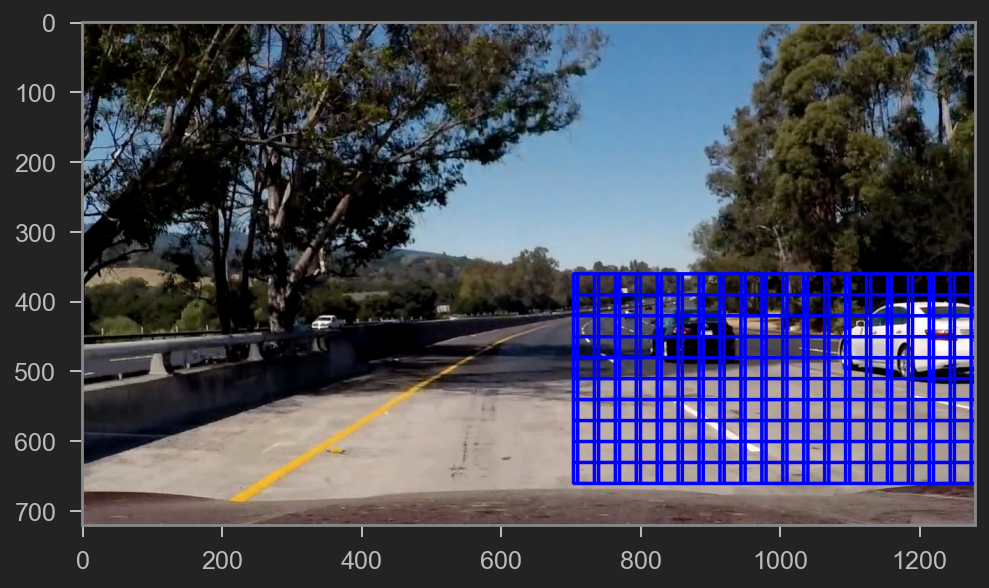

In [173]:
test = ['test_images/test5.jpg']
image = mpimg.imread(test[0])
draw_img = np.copy(image)

windows_1 = get_windows(image, sizes=[120], overlap=.75)
windows_2 = get_windows(image, sizes=[180, 250], overlap=.75)
windows = windows_1
print(len(windows), 'windows')

car_windows = []
for window in windows:
    if detect_car(test, window, X_scaler):
        car_windows.append(window)
        
draw_img = draw_boxes(draw_img, car_windows)
heat = heatmap(image, car_windows)
heatmap_boxes = draw_heatmap_boxes(np.copy(image), heat)
plt.imshow(draw_img)

In [176]:
def detect_cars(img, svc, scaler=None, show_rects=False):
    cars = []
    colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb, LAB
    orient = 11
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 1 # Can be 0, 1, 2, or "ALL"
    color = {'HSV':cv2.COLOR_RGB2HSV, 'HLS':cv2.COLOR_RGB2HLS, 'YUV':cv2.COLOR_RGB2YUV, 'LAB':cv2.COLOR_RGB2LAB, 'LUV':cv2.COLOR_RGB2LUV}
    
    img = img.astype(np.float32) / 255
    draw_img = np.copy(image)

    boxes_1 = get_windows(image, sizes=[80],overlap=0.9,y_start_stop=(.5, .7))
    boxes_2 = get_windows(image, sizes=[100], overlap=0.8,y_start_stop=(.5, .7))
    boxes_3 = get_windows(image, sizes=[120], overlap=0.75,y_start_stop=(.7, .94))
    
    windows = np.concatenate((boxes_2, boxes_3))
    
    features = []
    # Iterate through the list of images
    for window in windows:
        top_l, bottom_r = window[0], window[1]
        crop_img = img[top_l[1]:bottom_r[1], top_l[0]:bottom_r[0],:]
        features = []
        get = extract_features_single(crop_img, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
        get = scaler.transform(get)
        
        #hog_features = scaler.transform(features)
    
        if svc.predict(get) == 1:
            cars.append(((window[0][0], window[0][1]), (window[1][0], window[1][1])))
    return cars

In [177]:
img = mpimg.imread('test_images/test5.jpg')
draw_img = np.copy(img)
heat = np.zeros_like(img[:,:,0])


detected = detect_cars(img, svc, X_scaler)
draw_img_l = draw_detected_boxes(img, detected, color=(0, 255, 255), thickness=2)

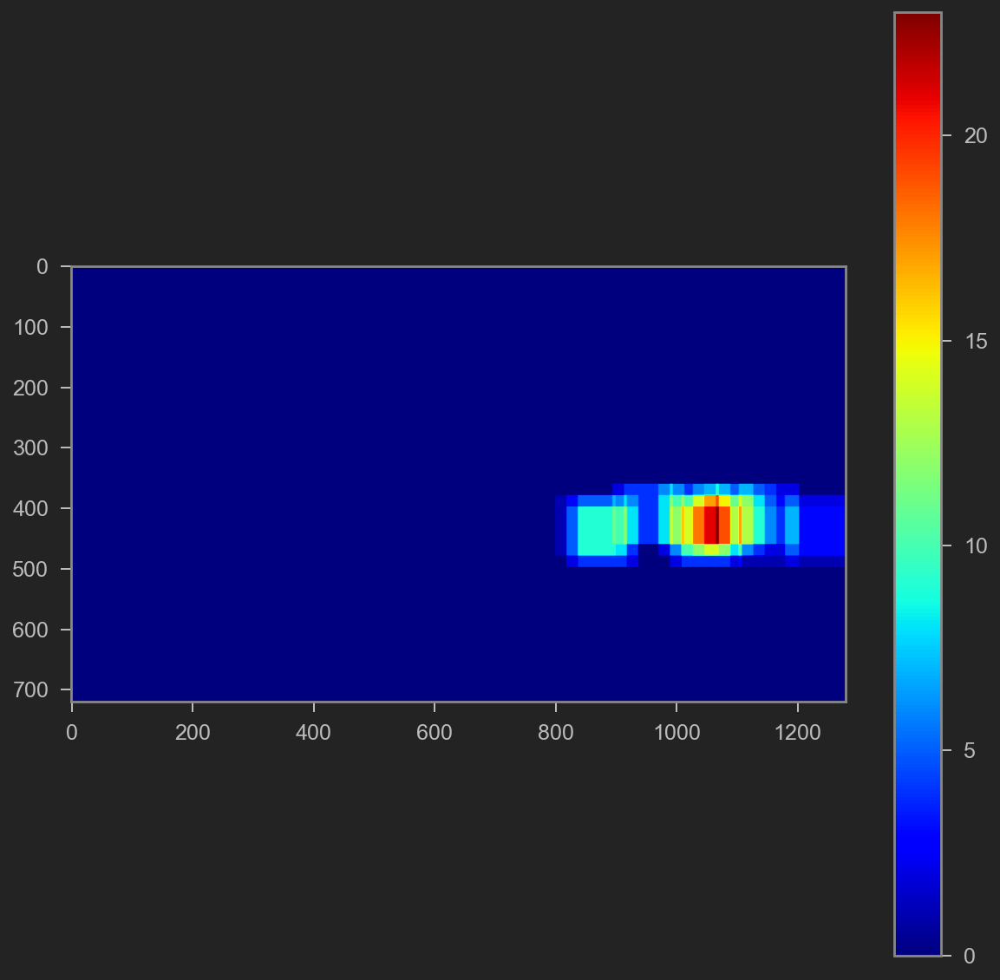

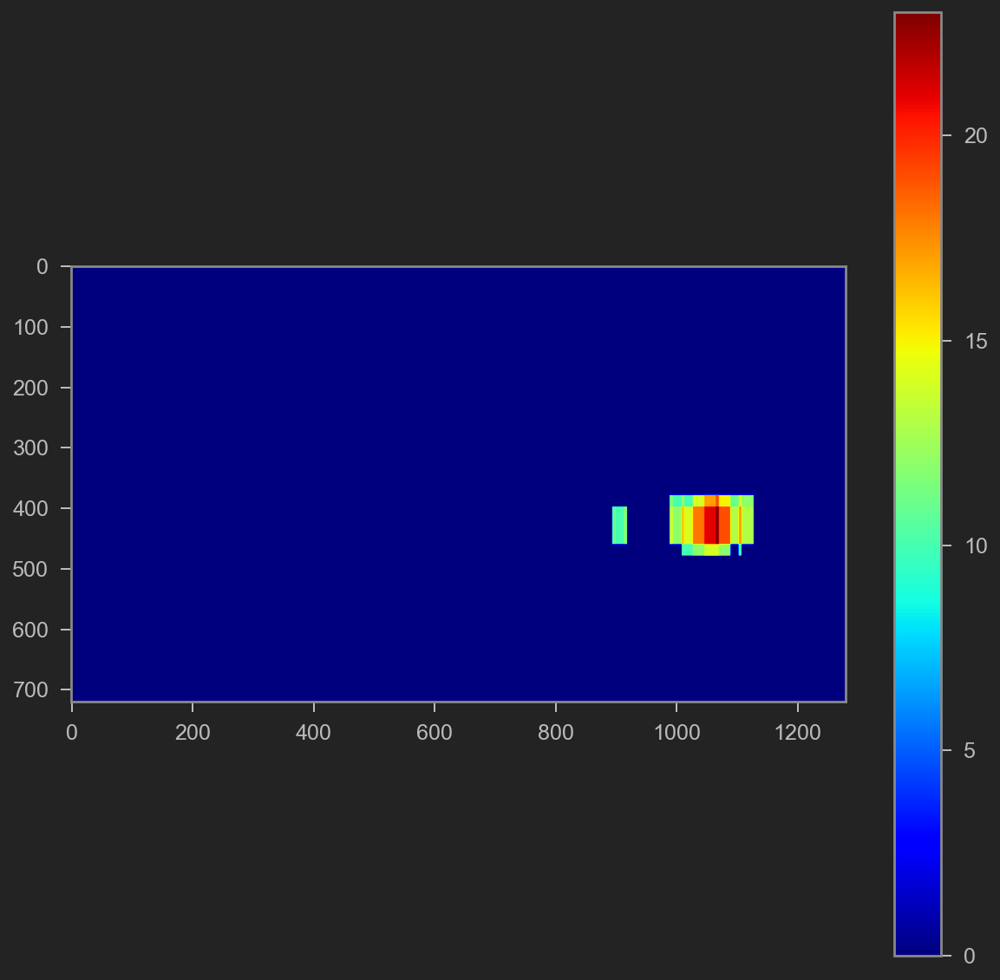

In [178]:
heat = heatmap(img, detected, min_thresh=0)
plt.figure(figsize=(10,10))
plt.imshow(heat, cmap='jet')
plt.colorbar()
plt.show()
heat = heatmap(img, detected, min_thresh=10)
plt.figure(figsize=(10,10))
plt.imshow(heat, cmap='jet')
plt.colorbar()
plt.show()

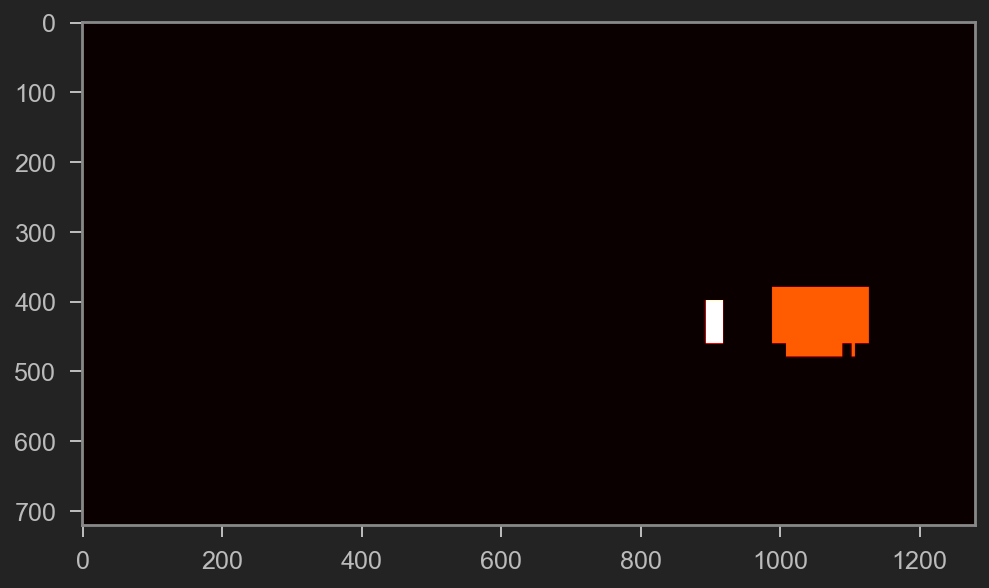

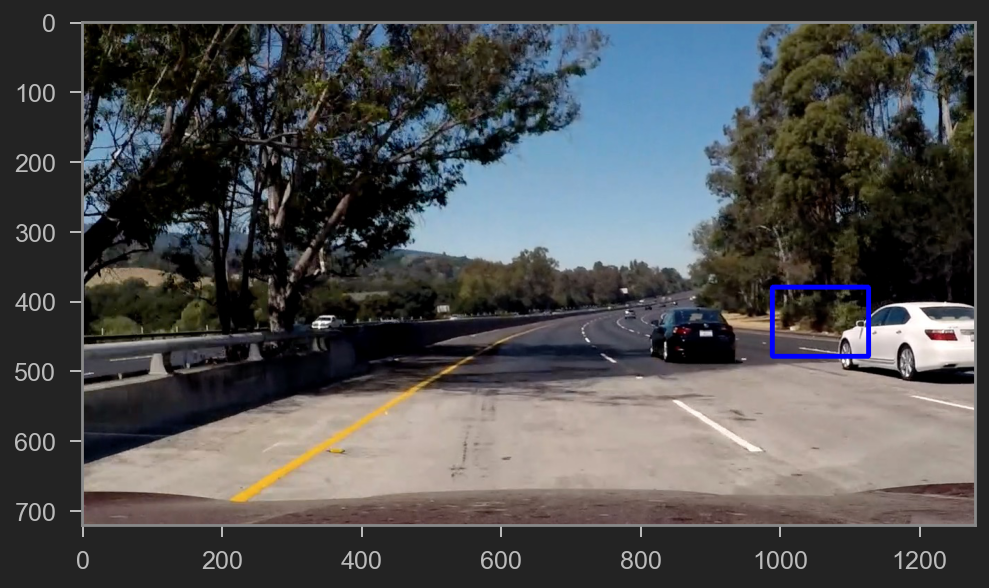

In [179]:
labels = label(heat)
label_img = labels[0].astype(np.uint8)
heatmap_boxes = draw_heatmap_boxes(np.copy(img), heat, 50)
plt.imshow(label_img, cmap='hot')
plt.show()

plt.imshow(heatmap_boxes)

In [ ]:
image = mpimg.imread('test_images/test1.jpg')

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    
    # Make a copy of the image
    imcopy = np.copy(img)
    
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
        
    # Return the image copy with boxes drawn
    return imcopy

# def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6, alternating_bbox_color=(0, 255, 0), copy=True):
#     """
#     Returns a new image the bounding boxes have been overlaid in the chosen color
#     """
#     imcopy = np.copy(img) if copy else img
#     for i, bbox in enumerate(bboxes):
#         c = color if i % 2 == 0 else alternating_bbox_color
#         cv2.rectangle(imcopy, bbox[0], bbox[1], c, thick)

#     return imcopy

In [84]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    
    # Initialize a list to append window positions to
    window_list = []
    
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
            
    # Return the list of windows
    return window_list

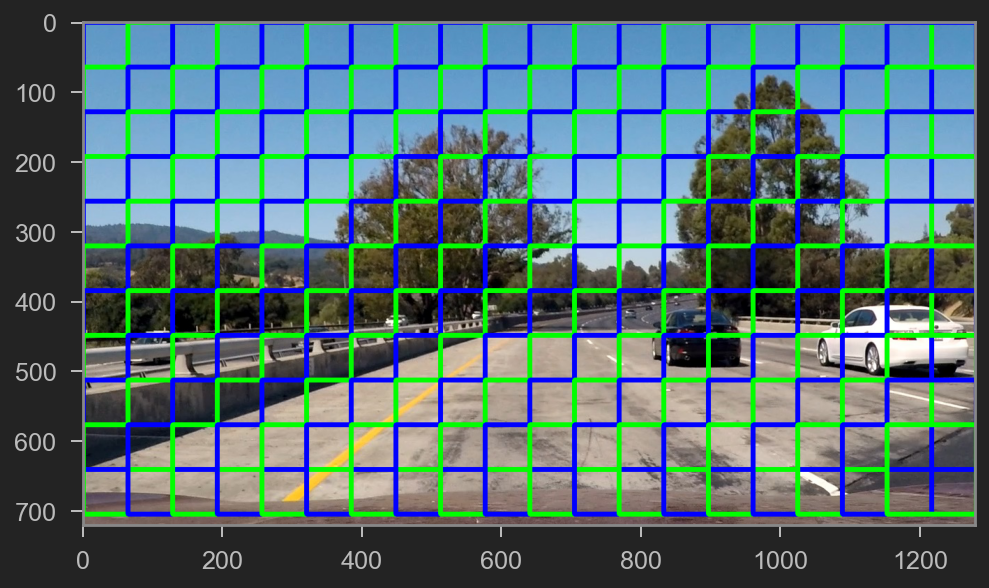

In [85]:
windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
                       xy_window=(128, 128), xy_overlap=(0.5, 0.5))
                       
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)

### 7. Search and Classify

In [58]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                     hist_bins=32, orient=9, 
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True):
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
            
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
            
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                                         orient, pix_per_cell, cell_per_block, 
                                                         vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
                
            # Append the new feature vector to the features list
            file_features.append(hog_features)
            
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [65]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):   
    
    #1) Define an empty list to receive features
    img_features = []
    
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)  
        
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
        
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
        
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                                     orient, pix_per_cell, cell_per_block, 
                                                     vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [66]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11  # HOG orientations
pix_per_cell = 14 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 1 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

In [67]:
def train_svc(images_v, images_nv):
    # images are divided up into vehicles and non-vehicles
    images1 = glob.glob(images_nv+'/*/*.png')
    notcars = []

    for image in images1:
        notcars.append(image)
    len(notcars)
    
     # images are divided up into vehicles and non-vehicles
    images2 = glob.glob(images_v+'/*/*.png')
    cars = []
    for image in images2:
        cars.append(image)
    len(cars)
    
#     # Read in cars and notcars
#     cars = []
#     notcars = []

#     for image in images:
#         if 'image' in image.split('/')[-1] or 'extra' in image.split('/')[-1]:
#             notcars.append(image)
#         else:
#             cars.append(image)
    
    car_features = extract_features(cars, color_space=color_space, 
                                    spatial_size=spatial_size, hist_bins=hist_bins, 
                                    orient=orient, pix_per_cell=pix_per_cell, 
                                    cell_per_block=cell_per_block, 
                                    hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                    hist_feat=hist_feat, hog_feat=hog_feat)
    
    notcar_features = extract_features(notcars, color_space=color_space, 
                                       spatial_size=spatial_size, hist_bins=hist_bins, 
                                       orient=orient, pix_per_cell=pix_per_cell, 
                                       cell_per_block=cell_per_block, 
                                       hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                       hist_feat=hist_feat, hog_feat=hog_feat)

    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    
    return (svc, X_scaler)

In [68]:
def classify_boxes(image, svc, X_scaler):
    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    #image = image.astype(np.float32)/255
    
#     windows = slide_window(image, x_start_stop=[None, None], y_start_stop=(360, 600), 
#                         xy_window=(64, 64), xy_overlap=(0.75, 0.75))
#     windows += slide_window(image, x_start_stop=[None, None], y_start_stop=(372, 600), 
#                         xy_window=(96, 96), xy_overlap=(0.75, 0.75))
#     windows += slide_window(image, x_start_stop=[None, None], y_start_stop=(384, 600), 
#                         xy_window=(144, 144), xy_overlap=(0.75, 0.75))
#     windows += slide_window(image, x_start_stop=[None, None], y_start_stop=(396, 600), 
#                         xy_window=(192, 192), xy_overlap=(0.75, 0.75))

    windows = slide_window(image, x_start_stop=[720, None], y_start_stop=(360, 600), 
                           xy_window=(96, 128), xy_overlap=(0.9, 0.9))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                                 spatial_size=spatial_size, hist_bins=hist_bins, 
                                 orient=orient, pix_per_cell=pix_per_cell, 
                                 cell_per_block=cell_per_block, 
                                 hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                 hist_feat=hist_feat, hog_feat=hog_feat)      
    return hot_windows

In [69]:
svc, X_scaler = train_svc('vehicles','non-vehicles')

Using: 11 orientations 14 pixels per cell and 2 cells per block
Feature vector length: 1260
6.36 Seconds to train SVC...
Test Accuracy of SVC =  0.9505


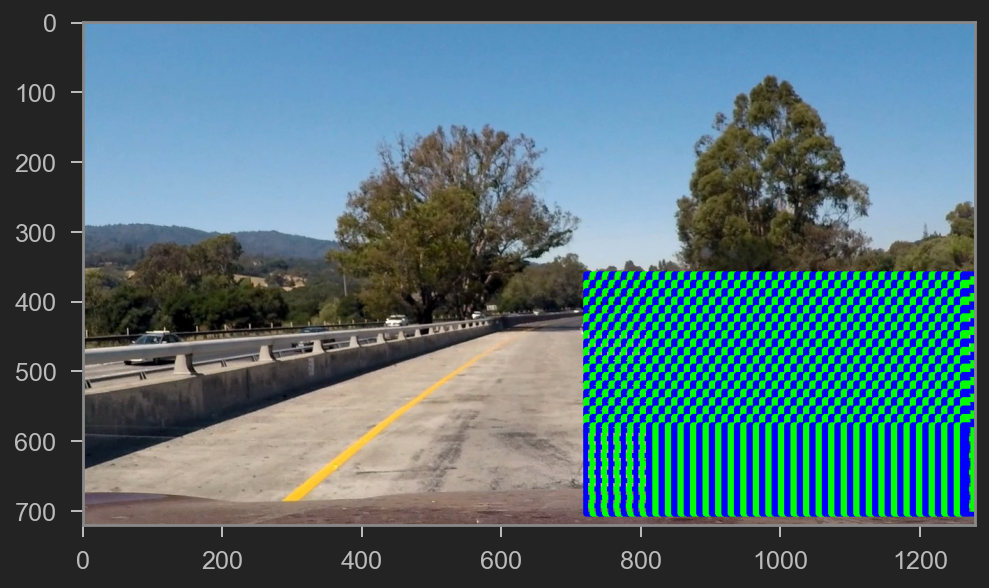

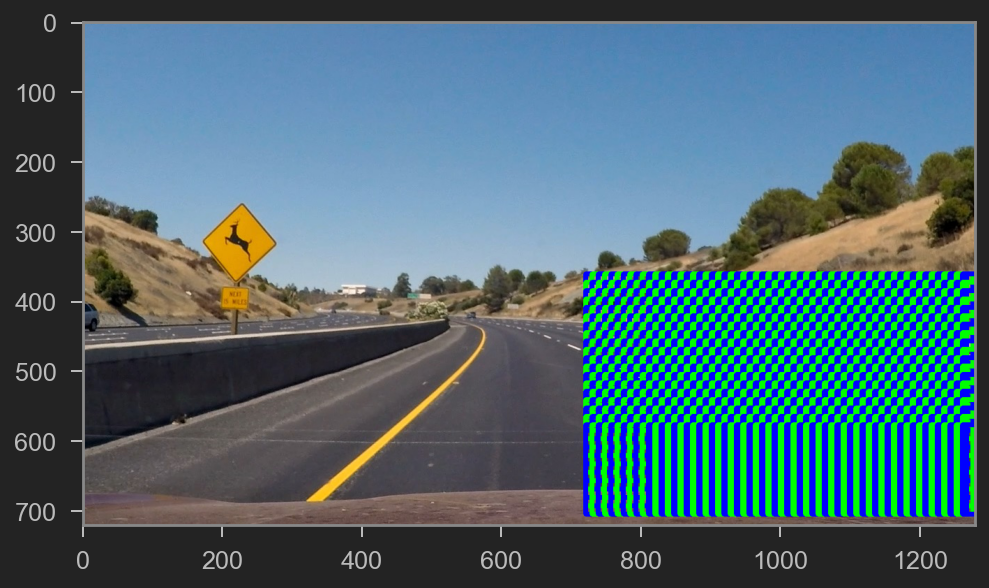

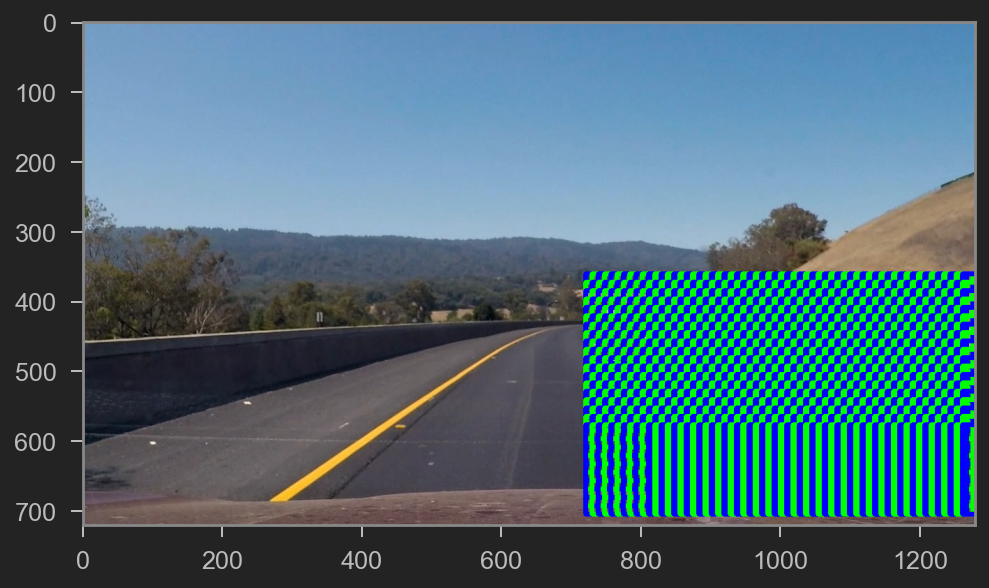

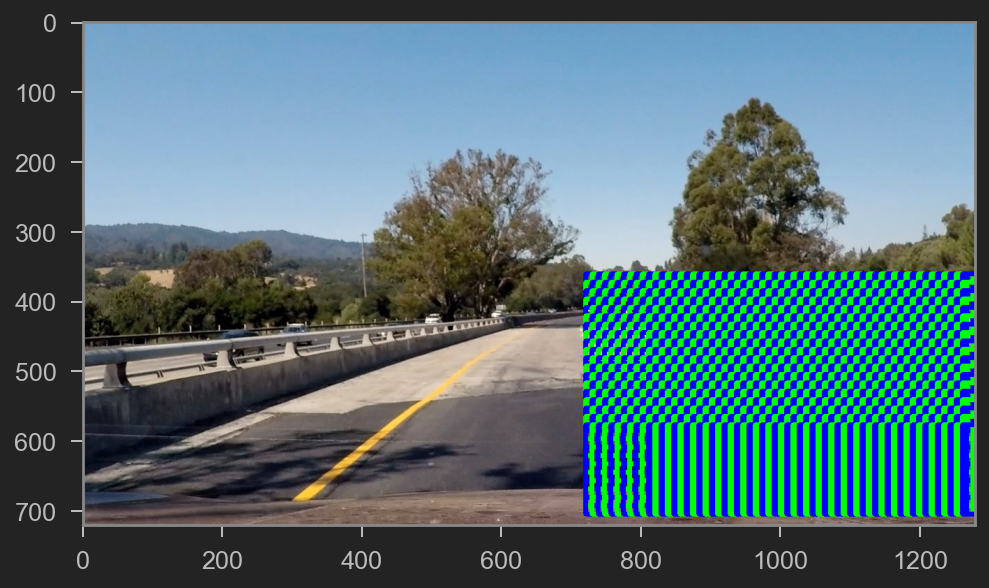

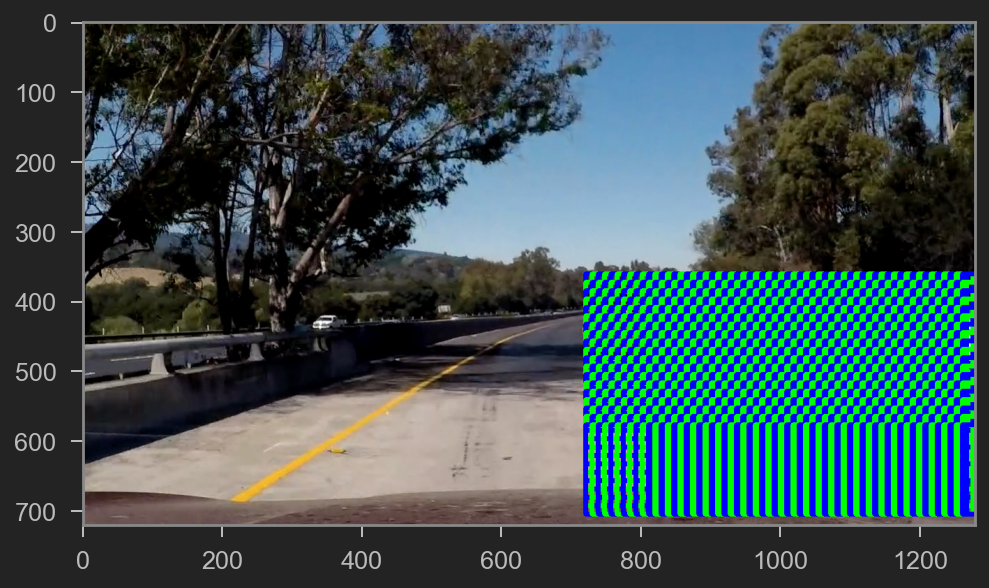

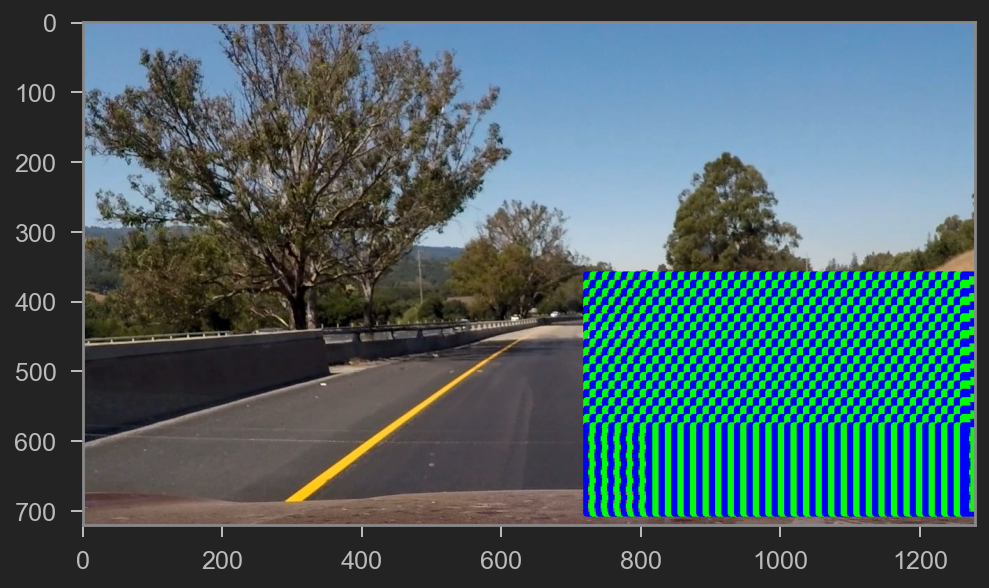

In [86]:
test_images = glob.glob('test_images/*.jpg')
windows = {}
for fname in test_images:
    fig = plt.figure()
    image = mpimg.imread(fname)
    windows[fname] = classify_boxes(image, svc, X_scaler)
    draw_image = np.copy(image)
    window_img = draw_boxes(draw_image, windows[fname], color=(0, 0, 255), thick=6)                    
    plt.imshow(window_img)

### 8. Multiple Detections and False Positives

In [72]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    
    for box in bbox_list:
        
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes

def create_heatmap(img, bbox_list):
    """Returns a new heatmap where the regions of the image captured by the bounding boxes are "heated-up""""
    heatmap = np.zeros_like(img[:,:,0]).astype(np.float)
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    
    heatmap = np.clip(heatmap, 0, 255)

    return heatmap

In [73]:
def threshold_heatmap(heatmap, threshold=2):
    """Updates the heatmap by only retaining hot sections whose values are strictly above the threshold.
    All other values are "cooled" down"""
    
    heatmap_copy = np.copy(heatmap)
    
    # Zero out pixels below the threshold
    heatmap_copy[heatmap_copy < threshold] = 0
    
    # Return thresholded map
    return heatmap_copy

def label_heatmap(heatmap):
    """Returns a slice with labels over the original heatmap, as well as the total count of labels found"""
    return label(heatmap)

In [74]:
def find_smoothed_boxes(img, labels, duplicate=True, min_area_filter=32*32):
    """Returns a set of bounding boxes where each bounding box is the aggregations of neibhouring boxes for the same label"""
    aggregate_bboxes = []
    
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        top_left = (np.min(nonzerox), np.min(nonzeroy))
        bottom_right = (np.max(nonzerox), np.max(nonzeroy))
        
        if (bottom_right[0] - top_left[0]) * (bottom_right[1] - top_left[1]) < min_area_filter:
            continue
        
        # Define a bounding box based on min/max x and y
        aggregate_bboxes.append(((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy))))
        
    # Return the image
    return aggregate_bboxes

In [75]:
def smoothen_bounding_boxes(img, bboxes, thres=2):
    heat = create_heatmap(img, bboxes)
    heat_thresholded = threshold_heatmap(heat, threshold=thres)
    heat_labels = label_heatmap(heat_thresholded)
    smoothed_bboxes = find_smoothed_boxes(img, heat_labels)
    
    return heat, heat_thresholded, heat_labels, smoothed_bboxes

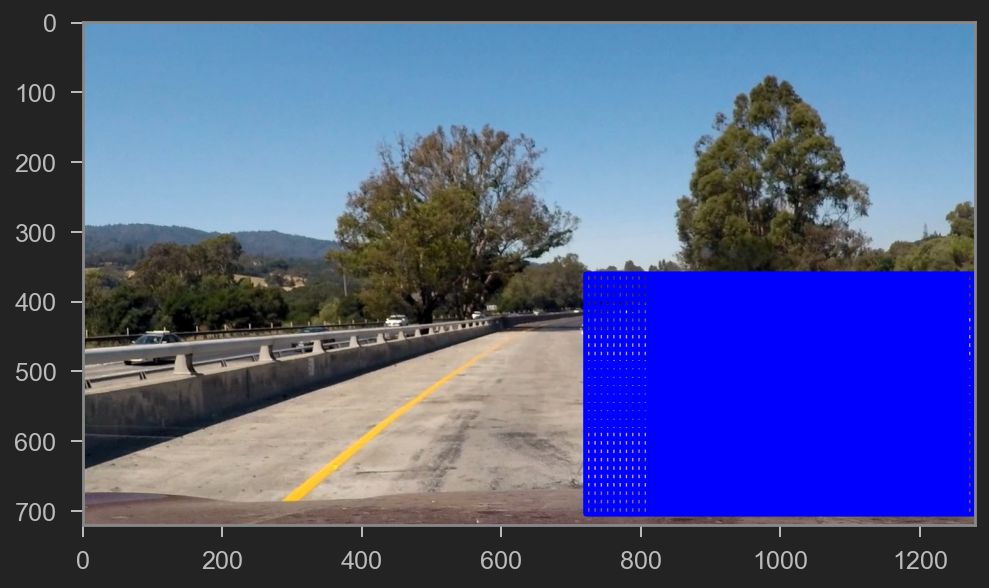

In [77]:
fig = plt.figure()
image = mpimg.imread('test_images/test1.jpg')
mc_bboxes = classify_boxes(image, svc, X_scaler)
draw_image = np.copy(image)
window_img = draw_boxes(draw_image, mc_bboxes, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)

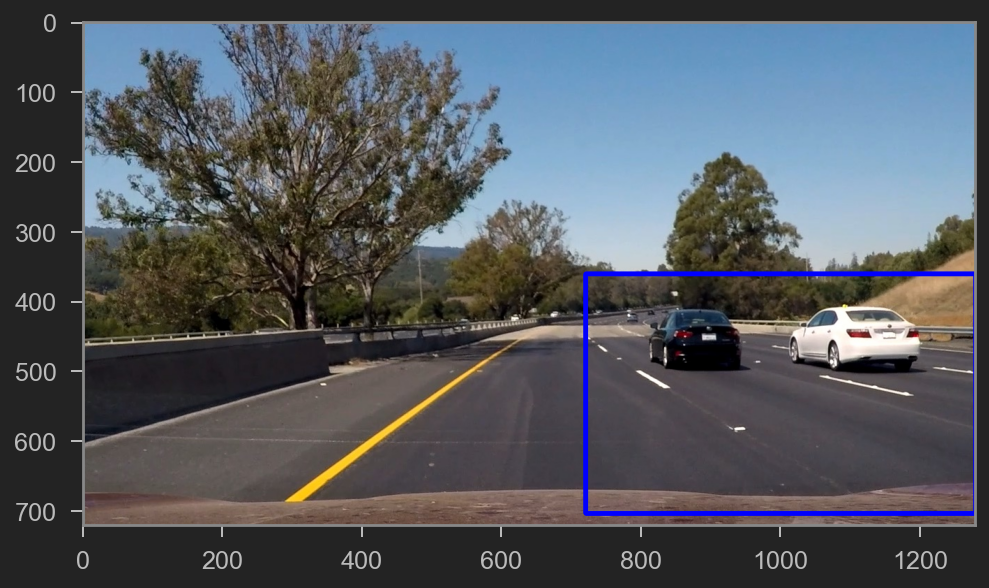

In [78]:
heatmap, heatmap_thres, heatmap_lbs, smoothed_bboxes = smoothen_bounding_boxes(test_imgs[5], mc_bboxes, thres=1)

plt.imshow(draw_boxes(test_imgs[5], smoothed_bboxes))

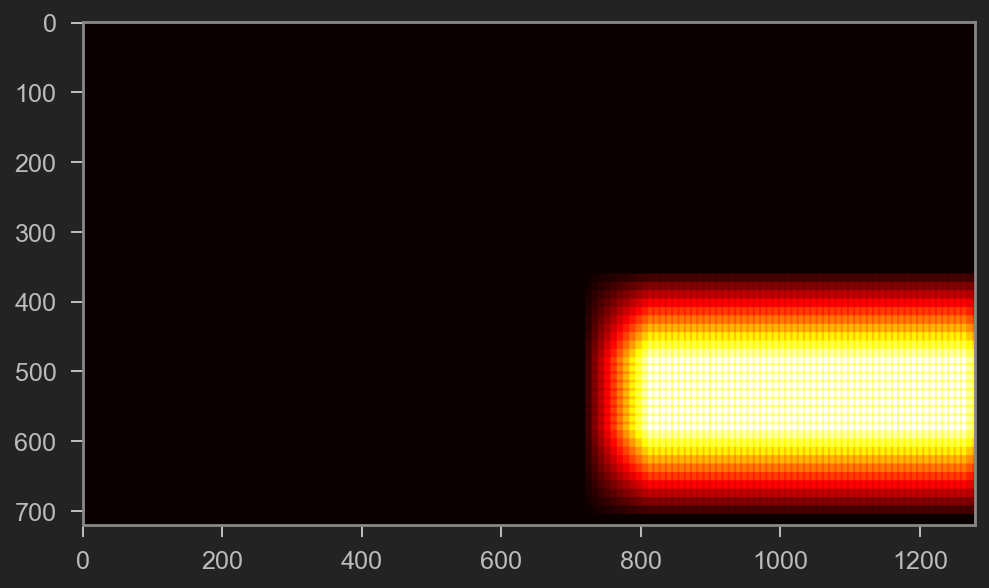

In [79]:
plt.imshow(heatmap * 255, cmap="hot")

In [81]:
def create_heatmap_rgb_img(hmap):
    """
    Create a heatmap from a binary image
    """
    scale = np.max(hmap) / 255
    if scale == 0:
        # Handle the zero case. We could also add an epsilon
        scale = 1
    z = np.zeros_like(hmap).astype(np.uint8)
    hm_scaled = (hmap / scale).astype(np.uint8)
    return np.dstack((hm_scaled, z, z))

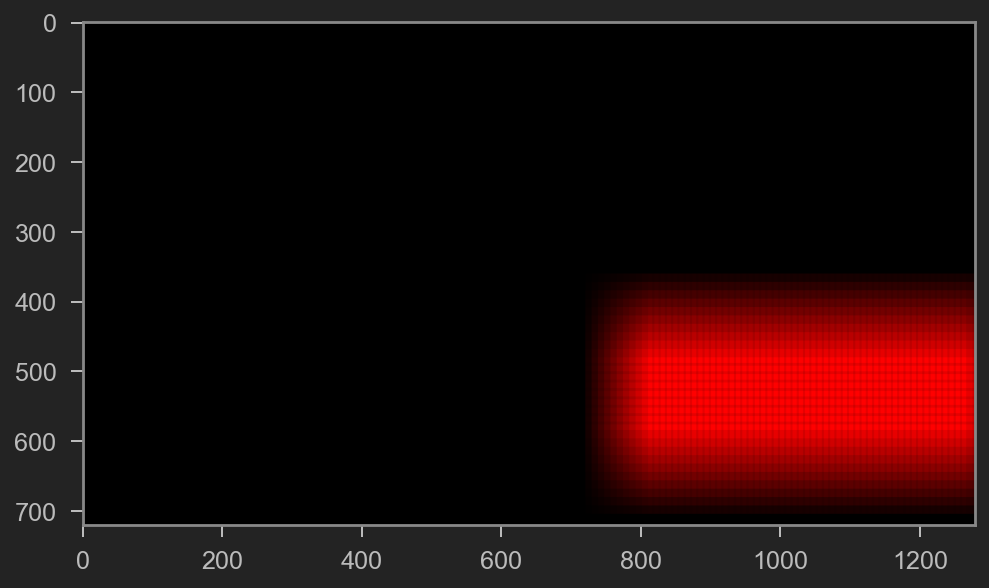

In [82]:
hm_scaled = create_heatmap_rgb_img(heatmap)
plt.imshow(hm_scaled)

In [87]:
svc, X_scaler = train_svc('vehicles','non-vehicles')

Using: 11 orientations 14 pixels per cell and 2 cells per block
Feature vector length: 1260
7.14 Seconds to train SVC...
Test Accuracy of SVC =  0.9462


<Figure size 576x504 with 0 Axes>

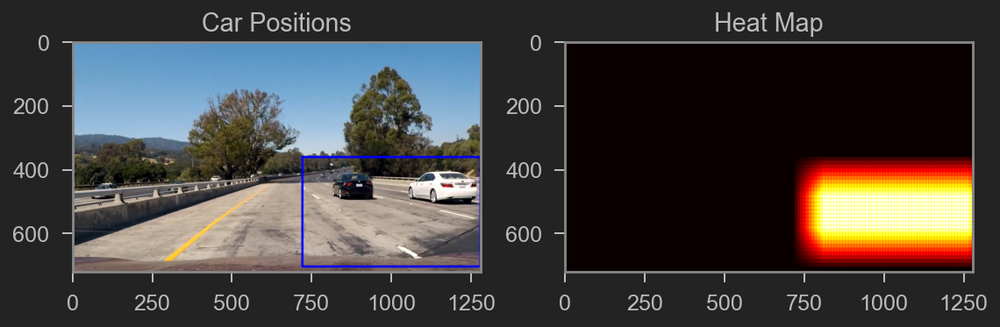

<Figure size 576x504 with 0 Axes>

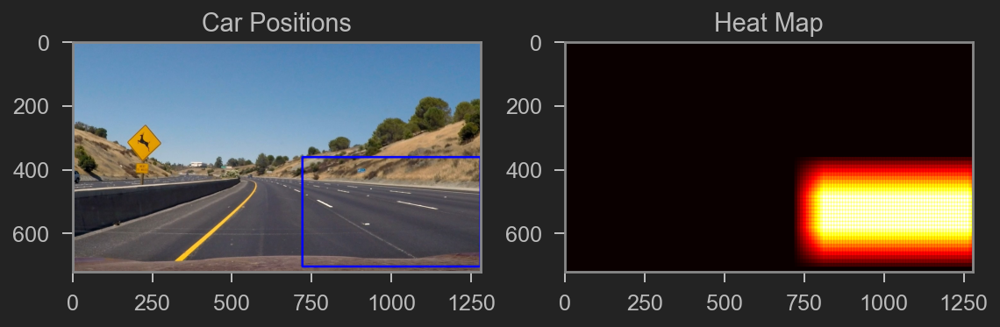

<Figure size 576x504 with 0 Axes>

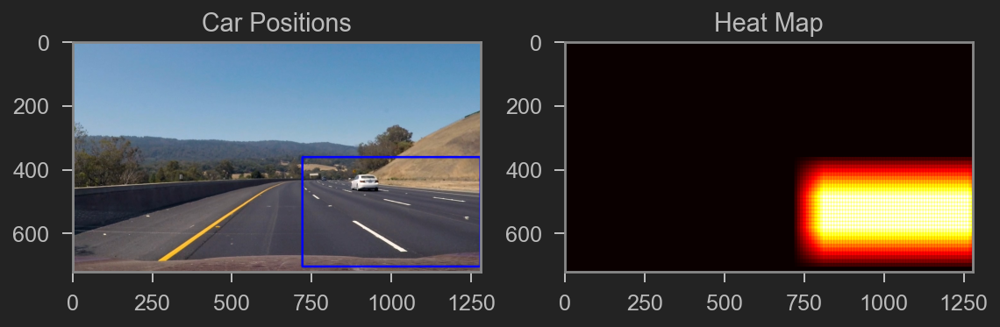

<Figure size 576x504 with 0 Axes>

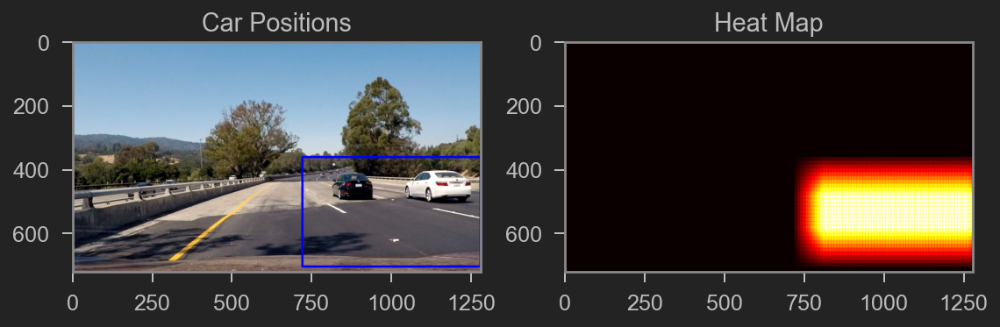

<Figure size 576x504 with 0 Axes>

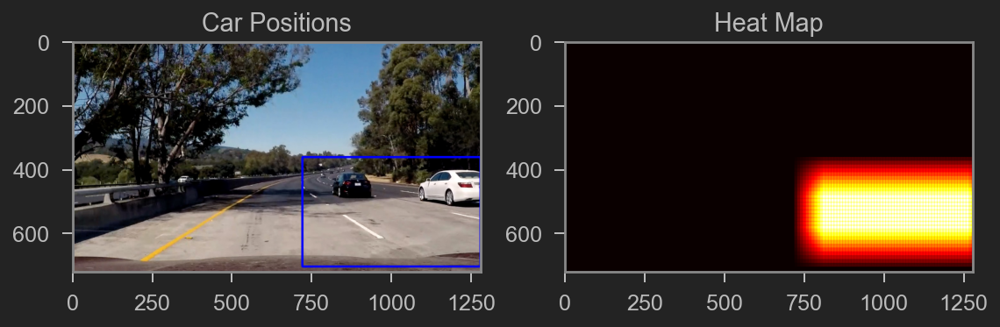

<Figure size 576x504 with 0 Axes>

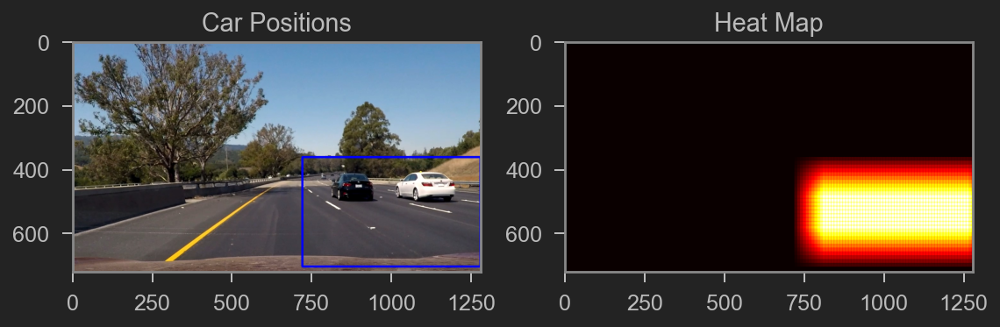

In [89]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    fig = plt.figure()
    image = mpimg.imread(fname)
    box_list = windows[fname]
    
    mc_bboxes = classify_boxes(image, svc, X_scaler)
    
    heatmap, heatmap_thres, heatmap_lbs, smoothed_bboxes = smoothen_bounding_boxes(image, mc_bboxes, thres=1)
    
    draw_img = draw_boxes(image, smoothed_bboxes)
    
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(draw_img)
    plt.title('Car Positions')
    plt.subplot(122)
    plt.imshow(heatmap * 255, cmap="hot")
    plt.title('Heat Map')
    fig.tight_layout()

# Video Pipeline

In [47]:
from moviepy.editor import VideoFileClip

svc, X_scaler = train_svc('vehicles','non-vehicles')

def process_frame(image):
    windows = classify_boxes(image, svc, X_scaler)
    heatmap, heatmap_thres, heatmap_lbs, smoothed_bboxes = smoothen_bounding_boxes(image, windows, thres=1)
    
    
    draw_img = draw_boxes(image, smoothed_bboxes)
    
    return draw_img

video_output = 'result.mp4'
clip = VideoFileClip("project_video.mp4")
white_clip = clip.fl_image(process_frame) 
white_clip.write_videofile(video_output, audio=False)

Using: 9 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 1188
2.61 Seconds to train SVC...
Test Accuracy of SVC =  0.9741
Moviepy - Building video result.mp4.
Moviepy - Writing video result.mp4



Moviepy - Done !
Moviepy - video ready result.mp4


In [48]:
from IPython.display import HTML
HTML("""<video width="640" height="360" controls>
        <source src="{0}">
        </video>""".format('result.mp4'))

In [ ]:
# import matplotlib.image as mpimg
# image = mpimg.imread(image)
# def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    
#     # Make a copy of the image
#     imcopy = np.copy(img)
    
#     # Iterate through the bounding boxes
#     for bbox in bboxes:
#         # Draw a rectangle given bbox coordinates
#         cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
        
#     # Return the image copy with boxes drawn
#     return imcopy

# def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
#                  xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    
#     # If x and/or y start/stop positions not defined, set to image size
#     if x_start_stop[0] == None:
#         x_start_stop[0] = 0
#     if x_start_stop[1] == None:
#         x_start_stop[1] = img.shape[1]
#     if y_start_stop[0] == None:
#         y_start_stop[0] = 0
#     if y_start_stop[1] == None:
#         y_start_stop[1] = img.shape[0]
        
#     # Compute the span of the region to be searched    
#     xspan = x_start_stop[1] - x_start_stop[0]
#     yspan = y_start_stop[1] - y_start_stop[0]
    
#     # Compute the number of pixels per step in x/y
#     nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
#     ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
#     # Compute the number of windows in x/y
#     nx_windows = np.int(xspan/nx_pix_per_step) - 1
#     ny_windows = np.int(yspan/ny_pix_per_step) - 1
    
#     # Initialize a list to append window positions to
#     window_list = []
    
#     # Loop through finding x and y window positions
#     # Note: you could vectorize this step, but in practice
#     # you'll be considering windows one by one with your
#     # classifier, so looping makes sense
#     for ys in range(ny_windows):
#         for xs in range(nx_windows):
#             # Calculate window position
#             startx = xs*nx_pix_per_step + x_start_stop[0]
#             endx = startx + xy_window[0]
#             starty = ys*ny_pix_per_step + y_start_stop[0]
#             endy = starty + xy_window[1]
#             # Append window position to list
#             window_list.append(((startx, starty), (endx, endy)))
            
#     # Return the list of windows
#     return window_list

# windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[None, None], 
#                        xy_window=(255, 255), xy_overlap=(0.5, 0.5))
                       
# window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
# plt.imshow(window_img)

# for window in windows:
#     test_img = cv2.resize(image[window[0][1]:window[1][1], window[0][0]:window[1][0]], (224, 224))
#     img = np.array(test_img,dtype='uint8')
#     img = img.reshape(-1, 224, 224, 3)
#     model = load_model('xception_weights.hdf5')
#     predict = model.predict(img)
#     index = np.argmax(predict)
#     if(index < 18):
#         print(class_names[index])
#         print(predict[0][index])